# パッケージインストール

In [1]:
!pip install -q tf-slim

# リポジトリクローン

In [2]:
!git clone https://github.com/SystemErrorWang/White-box-Cartoonization

Cloning into 'White-box-Cartoonization'...
remote: Enumerating objects: 205, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 205 (delta 2), reused 2 (delta 0), pack-reused 199 (from 1)
Receiving objects: 100% (205/205), 44.61 MiB | 17.06 MiB/s, done.
Resolving deltas: 100% (76/76), done.


In [3]:
%cd White-box-Cartoonization/test_code

/content/White-box-Cartoonization/test_code


# TensorFlow 1.x系 暫定対応

In [4]:
file_path = 'network.py'

with open(file_path) as fp:
    file_lines = fp.read()

file_lines = file_lines.replace(
    "import tensorflow.contrib.slim as slim",
    "import tf_slim as slim",
)
file_lines = file_lines.replace(
    "    with tf.variable_scope(name):",
    "    with tf.compat.v1.variable_scope(name):",
)
file_lines = file_lines.replace(
    "    with tf.variable_scope(name, reuse=reuse):",
    "    with tf.compat.v1.variable_scope(name, reuse=reuse):",
)
file_lines = file_lines.replace(
    "        x3 = tf.image.resize_bilinear(x2, (h1*2, w1*2))",
    "        x3 = tf.image.resize(x2, (h1*2, w1*2), method=tf.image.ResizeMethod.BILINEAR)",
)
file_lines = file_lines.replace(
    "        x4 = tf.image.resize_bilinear(x3, (h2*2, w2*2))",
    "        x4 = tf.image.resize(x3, (h2*2, w2*2), method=tf.image.ResizeMethod.BILINEAR)",
)

with open(file_path, mode="w") as fp:
    fp.write(file_lines)

# サンプル画像ダウンロード

In [5]:
!wget https://raw.githubusercontent.com/Kazuhito00/White-box-Cartoonization-Colaboratory-Sample/main/sample.jpg -q -O test.jpg

# モデルロード

In [6]:
import tensorflow.compat.v1 as tf

import network
import guided_filter

tf.disable_v2_behavior()
tf.disable_eager_execution()

input_photo = tf.placeholder(tf.float32, [1, None, None, 3])
network_out = network.unet_generator(input_photo)
final_out = guided_filter.guided_filter(
    input_photo,
    network_out,
    r=1,
    eps=5e-3,
)

all_vars = tf.trainable_variables()
gene_vars = [var for var in all_vars if 'generator' in var.name]
saver = tf.train.Saver(var_list=gene_vars)

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.Session(config=config)

sess.run(tf.global_variables_initializer())
saver.restore(sess, tf.train.latest_checkpoint('saved_models'))

Instructions for updating:
non-resource variables are not supported in the long term
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1694: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '


# 推論関連関数

In [7]:
import copy

import cv2
import numpy as np

def resize_crop(
    image,
    min_length=None,  # 720
):
    h, w, _ = np.shape(image)

    if min_length is not None:
        if min(h, w) > min_length:
            if h > w:
                h, w = int(min_length * h / w), min_length
            else:
                h, w = min_length, int(min_length * w / h)
        image = cv2.resize(image, (w, h), interpolation=cv2.INTER_AREA)

    h, w = (h // 8) * 8, (w // 8) * 8
    image = image[:h, :w, :]

    return image


def cartoonize(sess, final_out, image):
    input_image = copy.deepcopy(image)

    # 前処理
    input_image = resize_crop(input_image)
    batch_image = input_image.astype(np.float32) / 127.5 - 1
    batch_image = np.expand_dims(batch_image, axis=0)

    # 推論
    output_image = sess.run(final_out, feed_dict={input_photo: batch_image})

    # 後処理
    output_image = (np.squeeze(output_image) + 1) * 127.5
    output_image = np.clip(output_image, 0, 255).astype(np.uint8)

    return output_image

# White-box-Cartoonization実行

In [8]:
image = cv2.imread('test.jpg')
output_image = cartoonize(sess, final_out, image)

# 結果確認

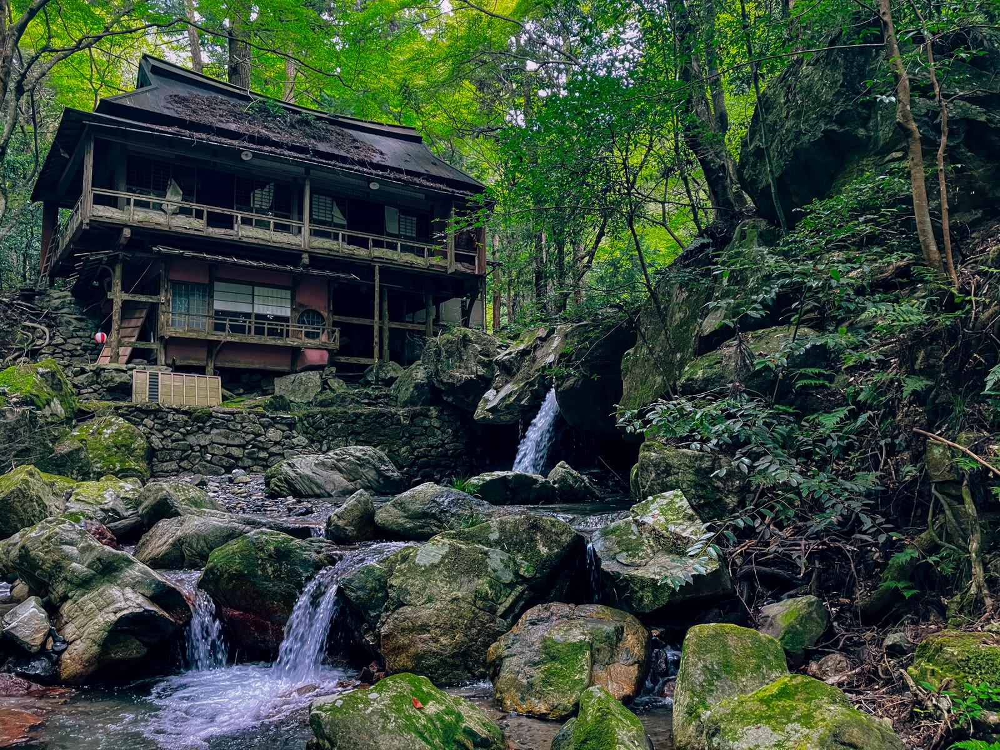

In [9]:
import cv2
from google.colab.patches import cv2_imshow

cv2_imshow(image)

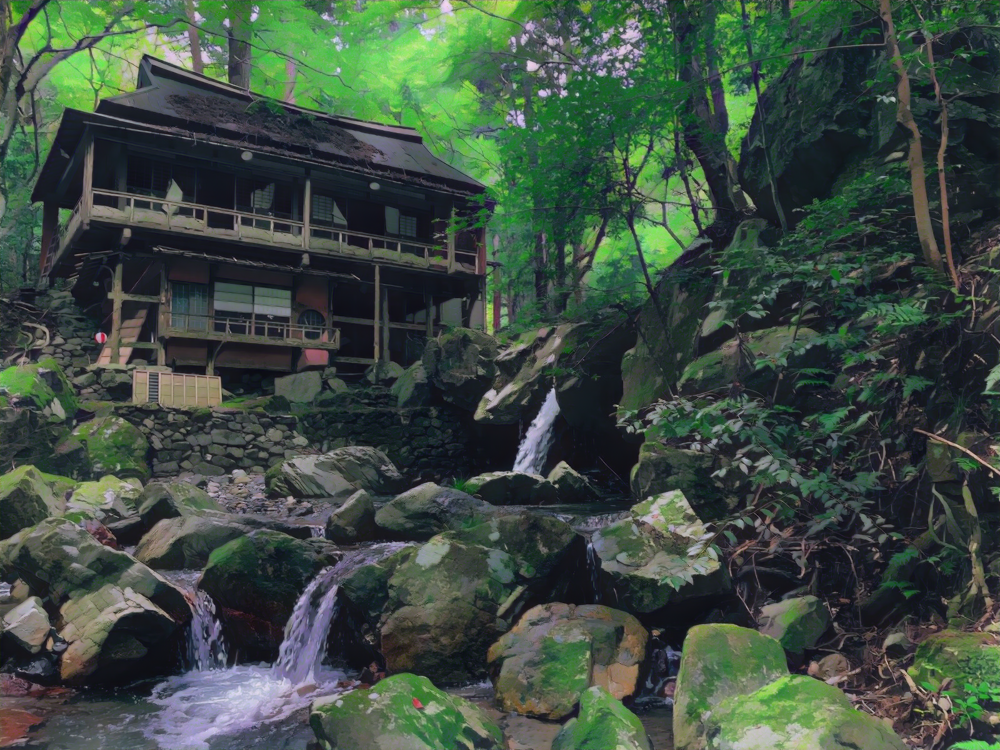

In [10]:
cv2_imshow(output_image)